In [1]:
%pip install matplotlib
%pip install numpy
%pip install pandas
%pip install seaborn
%pip install mesa
%pip install batch_run

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: Could not find a version that satisfies the requirement batch_run (from versions: none)
ERROR: No matching distribution found for batch_run
Note: you may need to restart the kernel to use updated packages.


In [2]:
from mesa import Agent, Model
from mesa.space import MultiGrid
from mesa.time import RandomActivation
from mesa.datacollection import DataCollector
from mesa.batchrunner import batch_run
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import seaborn as sns

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['animation.embed_limit'] = 2**128

In [15]:
class Robots(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.CargandoCajas = 0
        self.steps = 0
        self.centrado = False

    def move(self):
        pos_center = (self.model.PilaCoordenadas[0],self.model.PilaCoordenadas[1])
        if self.CargandoCajas > 0:
            if self.pos == tuple(pos_center) and self.CargandoCajas > 0:
                agente = self.model.grid.get_cell_list_contents([pos_center])
                if len(agente) == 1: 
                    cajas_restantes = self.model.depositar_caja(self.CargandoCajas)
                    self.CargandoCajas = cajas_restantes  
                    self.centrado = False
                else:
                    self.centrado = True  
            else:
                self.centrado = True
                pasos_pos = self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False)
                paso_corto = min(pasos_pos, key=lambda x: self.distance(x, pos_center))

                agente = self.model.grid.get_cell_list_contents([paso_corto])
                if len(agente) == 0:  
                    self.model.grid.move_agent(self, paso_corto)
                    self.steps +=1
        else:
            caja_pos=self.encontrar_caja(self.pos)
            if caja_pos is None:
                caja_pos=(1,1)
            pasos_pos = ()
            celdas_vecinas = self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False, radius=1)
            for celda_vecina in celdas_vecinas:
                agente = self.model.grid.get_cell_list_contents([celda_vecina])
                if len(agente) == 0:  
                    pasos_pos += (celda_vecina,)
            if pasos_pos:
                if(self.pos==caja_pos):
                    for celda_vecina in celdas_vecinas:
                        x, y = celda_vecina
                        if self.model.celdas_ocupadas[x, y] == 1 and celda_vecina!=pos_center: 
                            self.model.celdas_ocupadas[x, y] = 0  
                            self.CargandoCajas += 1
                paso_corto = min(pasos_pos, key=lambda x: self.distance(x,  caja_pos))
                self.model.grid.move_agent(self, paso_corto)
                self.steps +=1
            else:
                if(self.pos==pos_center):
                    print('No hay celdas disponibles para moverse')
                    self.model.mover_agentes_abajo()
                else:
                    return

    def distance(self, pos1, pos2):
        return abs(pos1[0] - pos2[0]) + abs(pos1[1] - pos2[1])

    def encontrar_caja(self, pos):
        caja_positions = self.model.get_caja_positions()
        if not np.any(caja_positions):
            return None  

        closest_pos = None
        min_dist = float('inf')

        caja_positions = np.argwhere(caja_positions == 1)
        for coord in caja_positions:
            x, y = coord  
            dist = self.distance(pos, (x, y))
            if dist < min_dist:
                min_dist = dist
                closest_pos = (x, y)

        if closest_pos is None:
            return None  

        vecinos=self.model.grid.get_neighborhood(closest_pos,moore=False, include_center=False, radius=1)
        for vecino_pos in vecinos:
            dist = self.distance(pos, vecino_pos)
            if dist < min_dist:
                min_dist = dist
                closest_pos = vecino_pos

        return closest_pos

    def step(self):
        self.move()

class Cuarto(Model):

    def __init__(self, porcentaje_ocupadas, N, width, height):
        super().__init__()
        self.pasos = 0
        self.cantidadPilas = 0
        self.cajasAcomodadas = 0  
        self.grid = MultiGrid(width, height, False)
        self.schedule = RandomActivation(self)
        self.datacollector = DataCollector(
            model_reporters={
                "RobotsPositions": lambda m: [agent.pos for agent in m.schedule.agents],
                "CajaPositions": self.get_caja_positions,
                "Pasos": lambda m: m.pasos,
                "CajasAcomodadas": lambda m: m.cajasAcomodadas 
            },
            agent_reporters={"Steps": "steps"}
        )
        self.num_ocupadas = round(width*height*porcentaje_ocupadas)
        self.cantidadPilasObjetivo = round(self.num_ocupadas / 5)
        self.PilaCoordenadas = [0,0]

        self.celdas_ocupadas = np.zeros((width, height), dtype=int)
        todas_las_celdas = [(x, y) for x in range(width) for y in range(height)]
        celdas_ocupadas_indices = self.random.sample(todas_las_celdas, self.num_ocupadas)

        for (x, y) in celdas_ocupadas_indices:
            self.celdas_ocupadas[x, y] = 1

        for i in range(N):
            a = Robots(i, self)
            self.schedule.add(a)
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            self.grid.place_agent(a, (x, y))


    def get_caja_positions(self):
        return self.celdas_ocupadas

    def mover_agentes_abajo(self):
        for agent in self.schedule.agents:
            if isinstance(agent, Robots):
                x, y = agent.pos
                new_y = y - 1
                if 0 <= new_y < self.grid.height:
                    new_pos = (x, new_y)
                    if self.grid.is_cell_empty(new_pos):
                        self.grid.move_agent(agent, new_pos)
                        agent.steps +=1

    def depositar_caja(self, cantidad):
        espacio_disponible = 5 - self.celdas_ocupadas[self.PilaCoordenadas[0], self.PilaCoordenadas[1]]
        cantidad_a_depositar = min(cantidad, espacio_disponible)

        self.celdas_ocupadas[self.PilaCoordenadas[0], self.PilaCoordenadas[1]] += cantidad_a_depositar
        self.cajasAcomodadas += cantidad_a_depositar 

        cantidad_restante = cantidad - cantidad_a_depositar

        if self.celdas_ocupadas[self.PilaCoordenadas[0], self.PilaCoordenadas[1]] == 5:
            self.cantidadPilas += 1
            self.PilaCoordenadas[1] += 1

        return cantidad_restante

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()
        self.pasos -= 1
        if self.cantidadPilas == self.cantidadPilasObjetivo:
            self.running = False  

In [17]:
# --- Run your model ---
porcentajeDeCajas = 0.25
numeroAgentes = 5
steps = 5000
alturaGrid = 20
largoGrid = 20

model = Cuarto(porcentajeDeCajas, numeroAgentes, alturaGrid, largoGrid)

step_count = 0
while model.running and step_count < steps:
    model.step()
    step_count += 1

print("Numero de pasos que realizo la simulacion",step_count)


Numero de pasos que realizo la simulacion 782


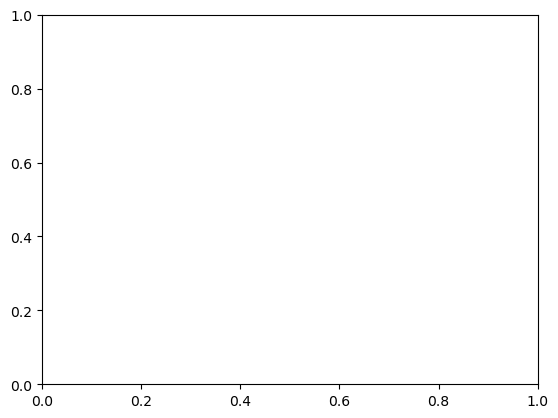

In [18]:
datacollector_df = model.datacollector.get_model_vars_dataframe()
cuenta_pasos = len(datacollector_df)
grids = []
for step in range(cuenta_pasos):
    robots_positions = datacollector_df.iloc[step]["RobotsPositions"]
    celdas_ocupadas = datacollector_df.iloc[step]["CajaPositions"]
    grid = np.zeros((model.grid.width, model.grid.height), dtype=int)

    for x in range(model.grid.width):
        for y in range(model.grid.height):
            grid[x][y] = celdas_ocupadas[x, y]
    grids.append((grid, robots_positions))

def update(frame):
    ax.clear()
    grid, robots_positions = grids[frame]

    mat = ax.matshow(grid, cmap=mcolors.ListedColormap(['white', 'saddlebrown']), origin='lower')

    for (i, j), val in np.ndenumerate(grid):
        if val > 0:
            ax.text(j, i, f'{val}', ha='center', va='center', color='red')

    for pos in robots_positions:
        x, y = pos
        circle = patches.Circle((y, x), radius=0.3, facecolor='blue', edgecolor='blue', linewidth=1)
        ax.add_patch(circle)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Pasos: {frame}")
    return [mat]

fig, ax = plt.subplots()
grid, _ = grids[0]

ani = anim.FuncAnimation(fig, update, frames=cuenta_pasos, interval=100, repeat=False)


In [19]:
ani


In [20]:
parameters = {"porcentaje_ocupadas":0.25, "N":5,"width": 20, "height": 20, }

results = batch_run(
    Cuarto,
    parameters=parameters,
    iterations=100,
    max_steps=5000,
    number_processes=1,
    data_collection_period=1,
    display_progress=True,
)

  0%|          | 0/100 [00:00<?, ?it/s]

No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles para moverse
No hay celdas disponibles

In [21]:
df = pd.DataFrame(results)
promedios = df.groupby("iteration")["Step"].mean()


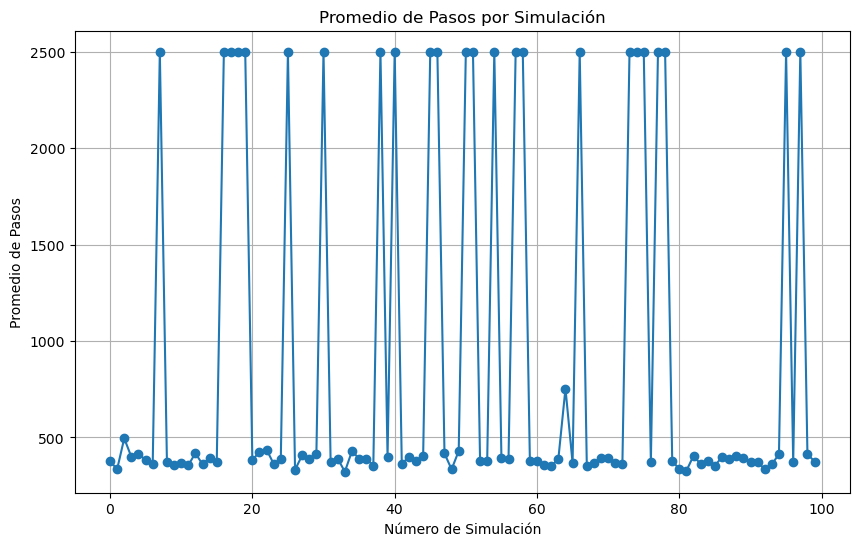

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(promedios.index, promedios.values, marker='o')
plt.xlabel("Número de Simulación")
plt.ylabel("Promedio de Pasos")
plt.title("Promedio de Pasos por Simulación")
plt.grid(True)
plt.show()

In [24]:
steps_per_simulation = df.groupby('iteration')['Step'].max()

# Calcular el promedio de pasos de todas las simulaciones
average_steps = steps_per_simulation.mean()

# Imprimir el promedio de pasos por simulación
print(f"Promedio de pasos por simulación: {average_steps:.2f}")

Promedio de pasos por simulación: 1786.36
